In [5]:
import matplotlib.pyplot as plt
import scienceplots
from tbparse import SummaryReader
import pandas as pd

plt.style.use('science')
plt.rcParams['figure.dpi'] = 300
plt.rcParams["figure.figsize"] = (14,6)
plt.rcParams.update({'font.size': 18})

In [ ]:
import json
from fedswarm import Platform
from fedswarm.utils.data.utils.oxts import plot_predictions, present_predictions, visualize_car_points
from fedswarm.utils.models.model_manager import load_model_from_checkpoint

with open("runs/2023-05-25_22:27:07/config.json") as f:
    config = json.load(f)
model = load_model_from_checkpoint("runs/2023-05-25_22:27:07/best_model.pth", config)

# load the platform with the config
platform = Platform(config, data_only=True)

In [ ]:
model_2 = load_model_from_checkpoint("runs/2023-05-25_22:19:10/best_model.pth", config)

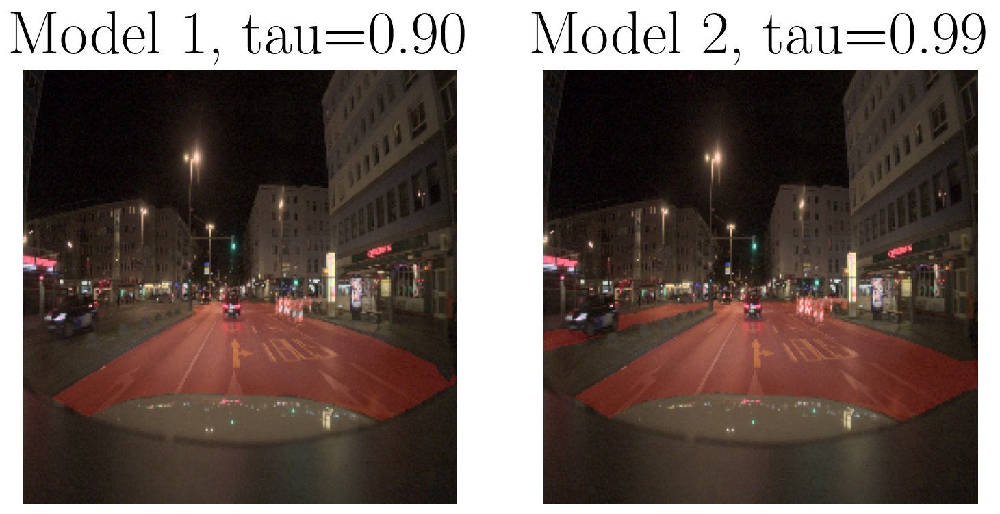

In [ ]:
from zod.visualization.polygon_utils import overlay_mask_on_image
from segmentation_models_pytorch.losses import DiceLoss

plt.rcParams['figure.dpi'] = 300

image, label = platform.data.central.val.dataset[16]
# model 1, tau=0.90
predictions = model(image.unsqueeze(0).cuda())
predictions = predictions.squeeze(0).detach().cpu().numpy()
mask = (predictions > 0.5).astype("uint8")
# model 2 tau=0.99
predictions_2 = model_2(image.unsqueeze(0).cuda())
predictions_2 = predictions_2.squeeze(0).detach().cpu().numpy()
mask_2 = (predictions_2 > 0.5).astype("uint8")

image = image.numpy()

# overlay the mask on the image
to_plottable = lambda image: ((image - image.min()) / (image.max() - image.min()) * 255).astype("uint8").transpose(1, 2, 0)

rendered_image = overlay_mask_on_image(mask, to_plottable(image), fill_color=(100, 0, 0), alpha=0.5)
rendered_image_2 = overlay_mask_on_image(mask_2, to_plottable(image), fill_color=(100, 0, 0), alpha=0.5)

# visualize the mask
# plot loss as title
plt.subplot(1, 2, 1)
plt.axis("off")
plt.imshow(rendered_image)
plt.title("Model 1, tau=0.90")
plt.subplot(1, 2, 2)
plt.imshow(rendered_image_2)
plt.title("Model 2, tau=0.99")
plt.axis("off")
plt.show()

In [13]:
run_name_federated="0.1data_0.05train_1e-3_20rounds_1epoch_160_federated_0.99tau"
run_name_centralised="0.1data_0.05train_1e-3_100epoch_160_central_0.99tau"
run_name_centralised_all_data="1.0data_1.0train_1e-3_50epoch_160_central_0.99tau"

window=100

# Federated
run_type="federated"
run_string = "Baseline" if run_type == "baseline" else "Federation"
reader = SummaryReader(f"runs/{run_name_federated}/", extra_columns=set(["dir_name"]))
df = reader.scalars
fed_global_loss = df[df.tag == f"{run_type}/loss/global"][["step", "value"]]
fed_client_ids = sorted(list(set([x for x in map(lambda x: x.split("clients")[-1][1], df.tag.unique()) if x.isdigit()])))
fed_batch_losses = [df[df.tag == f"{run_type}/loss/clients/{client_id}/batch"][["step", "value"]] for client_id in fed_client_ids]
fed_epoch_losses = [df[df.tag == f"{run_type}/loss/clients/{client_id}/epoch"][["step", "value", "tag", "dir_name"]] for client_id in fed_client_ids]

# Centralised
reader = SummaryReader(f"runs/{run_name_centralised}/", extra_columns=set(["dir_name"]))
df_central = reader.scalars
central_validation_loss = df_central[df_central.dir_name == "centralised_loss_epoch_validation"][["step", "value"]]
central_batch_loss = df_central[df_central.tag == "centralised/loss/batch"][["step", "value"]][:10000]
central_batch_rolling = central_batch_loss["value"].rolling(window=100, min_periods=1).mean().values

# Centralised ALL DATA
reader = SummaryReader(f"runs/{run_name_centralised_all_data}/", extra_columns=set(["dir_name"]))
df_central_all = reader.scalars
central_all_validation_loss = df_central_all[df_central_all.dir_name == "centralised_loss_epoch_validation"][["step", "value"]]
central_all_batch_loss = df_central_all[df_central_all.tag == "centralised/loss/batch"][["step", "value"]][:10000]
central_all_batch_rolling = central_all_batch_loss["value"].rolling(window=100, min_periods=1).mean().values

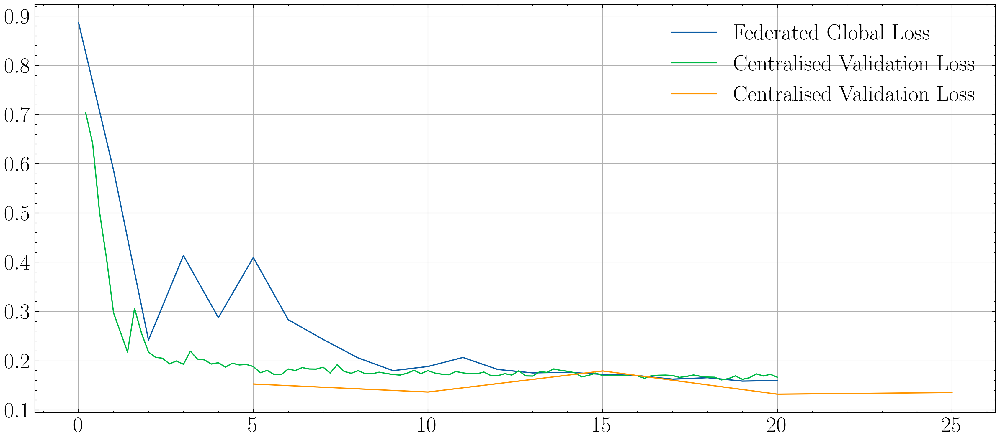

In [15]:
plt.plot(fed_global_loss.step, fed_global_loss.value, label="Federated Global Loss")
plt.plot(central_validation_loss.step/5, central_validation_loss.value, label="Centralised Validation Loss")
plt.plot(central_all_validation_loss.step*5, central_all_validation_loss.value, label="Centralised Validation Loss")
plt.legend(); plt.grid(); plt.show()

# NEW CHAPTER

In [6]:
import json
from fedswarm import Platform

config = {
    "data":{
        "path": "/mnt/ZOD",
        "version": "full",
        "ratio": 1,
        "ratio_val": 1,
        "img_size": [160,160],
        "skip_test": True,
        "transforms": "[Resize(img_size)]",
        "weak_augmentation": "[RandomHorizontalFlip(p=1), RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1))]",
        "strong_augmentation": "[GaussianBlur(13, sigma=(0.01, 2.0)), RandomAdjustSharpness(10, p=.5), RandomSolarize(.5, p=.5), ColorJitter(.2,.7,.4,.5), RandomInvert(p=0.5)]",
        "normalisation": "[Normalize(mean=[0.337, 0.345, 0.367], std=[0.160, 0.180, 0.214])]",
        "shuffle_seed": 150,
        "decentralised_shuffle_seed": 150,
        "dataloader_args": {
            "batch_size": 8,
            "num_workers": 1,
            "prefetch_factor": 128,
            "shuffle": True,
        },
        "train_val_id_generator":"ego_road",
        "dataset_getitem":"ego_road_segmentation",
    },
    "model":{
        "name": "fixmatchseg",
        "args": {},
        "loss": "",
        "optimiser": "Adam",
        "optimiser_args": {
            "lr": 1e-3,
        },
        "tau": 0.99
    },
    "central": {
        "train": False,
        "use_gpu": True,
        "epochs": 50
    }
}
# load the platform with the config
platform = Platform(config, data_only=True, write=False)

FixMatchSeg is not well supported, please use it with caution as config validation may not work


Same run already exists, skipping run but creates platform
Run found in 2023-06-07_23:04:54


Loading train frames:   0%|          | 0/89976 [00:00<?, ?it/s]

Loading val frames:   0%|          | 0/10024 [00:00<?, ?it/s]

In [16]:
len(set(platform.data.train._ids).intersection(set(platform.data.val._ids)))

25312

## Results

In [76]:
def add_delta_time(df):
    df['wall_time'] = pd.to_datetime(df['wall_time'], unit='s')
    start_time = df['wall_time'].min() # get the minimum 'wall_time' as the 'start_time'
    df['delta_time'] = df['wall_time'] - start_time
    df['delta_time_in_seconds'] = df['delta_time'].dt.total_seconds()

In [82]:
run_name_federated="federated_5000unlabelled_100labelled_5clients_50rounds_1epochs"
run_name_centralised="central_fixmatch_5000unlabelled_100labelled_30epochs_99tau"
run_name_centralised_all_data="central_5100labelled_50epochs_99tau"
run_name_central_local="central_100labelled_50epochs_99tau"

window=100

# Federated
run_type="federated"
run_string = "Baseline" if run_type == "baseline" else "Federation"
reader = SummaryReader(f"runs/{run_name_federated}/", extra_columns=set(["dir_name", "wall_time"]))
df = reader.scalars
add_delta_time(df)
fed_global_loss = df[df.tag == f"{run_type}/loss/global"]
fed_client_ids = sorted(list(set([x for x in map(lambda x: x.split("clients")[-1][1], df.tag.unique()) if x.isdigit()])))
fed_batch_losses = [df[df.tag == f"{run_type}/loss/clients/{client_id}/batch"] for client_id in fed_client_ids]
fed_epoch_losses = [df[df.tag == f"{run_type}/loss/clients/{client_id}/epoch"] for client_id in fed_client_ids]

# Centralised
reader = SummaryReader(f"runs/{run_name_centralised}/", extra_columns=set(["dir_name", "wall_time"]))
df_central = reader.scalars
add_delta_time(df_central)
central_validation_loss = df_central[df_central.dir_name == "centralised_loss_epoch_validation"]
central_batch_loss = df_central[df_central.tag == "centralised/loss/batch"]

# Centralised ALL DATA
reader = SummaryReader(f"runs/{run_name_centralised_all_data}/", extra_columns=set(["dir_name", "wall_time"]))
df_central_all = reader.scalars
add_delta_time(df_central_all)
central_all_validation_loss = df_central_all[df_central_all.dir_name == "centralised_loss_epoch_validation"]
central_all_batch_loss = df_central_all[df_central_all.tag == "centralised/loss/batch"]
central_all_batch_rolling = central_all_batch_loss["value"].rolling(window=100, min_periods=1).mean().values

# Centralised local
reader = SummaryReader(f"runs/{run_name_central_local}/", extra_columns=set(["dir_name", "wall_time"]))
df_central_local = reader.scalars
df_central_local['wall_time'] = pd.to_datetime(df_central_local['wall_time'], unit='s')
add_delta_time(df_central_local)
central_local_validation_loss = df_central_local[df_central_local.dir_name == "centralised_loss_epoch_validation"]
central_local_batch_loss = df_central_local[df_central_local.tag == "centralised/loss/batch"]
central_local_batch_rolling = central_local_batch_loss["value"].rolling(window=100, min_periods=1).mean().values

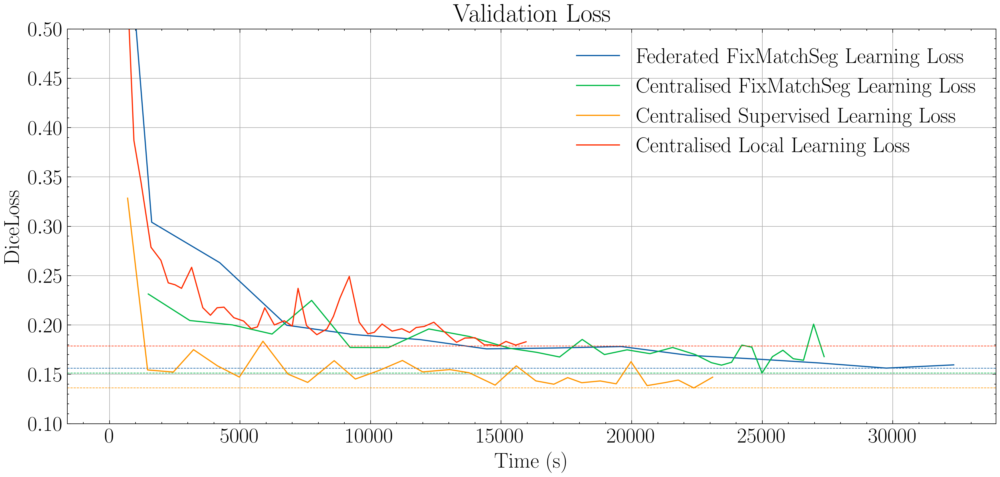

In [94]:
line1, = plt.plot(fed_global_loss.delta_time_in_seconds, fed_global_loss.value, label="Federated FixMatchSeg Learning Loss")
min_fed = fed_global_loss['value'].min()
plt.axhline(min_fed, color=line1.get_color(), linestyle='dashed', linewidth=0.5)

line1, = plt.plot(central_validation_loss.delta_time_in_seconds, central_validation_loss.value, label="Centralised FixMatchSeg Learning Loss")
min_fixmatchseg = central_validation_loss['value'].min()
plt.axhline(min_fixmatchseg, color=line1.get_color(), linestyle='dashed', linewidth=0.5)

line2, = plt.plot(central_all_validation_loss.delta_time_in_seconds, central_all_validation_loss.value, label="Centralised Supervised Learning Loss")
min_supervised = central_all_validation_loss['value'].min()
plt.axhline(min_supervised, color=line2.get_color(), linestyle='dashed', linewidth=0.5)

line3, = plt.plot(central_local_validation_loss.delta_time_in_seconds, central_local_validation_loss.value, label="Centralised Local Learning Loss")
min_local = central_local_validation_loss['value'].min()
plt.axhline(min_local, color=line3.get_color(), linestyle='dashed', linewidth=0.5)

plt.title("Validation Loss")
plt.xlabel("Time (s)")
plt.ylabel("DiceLoss")
plt.legend()
plt.grid()
plt.ylim(0.1, 0.5)
plt.savefig("plots/fixmatchseg_validation_loss.pdf")
plt.show()


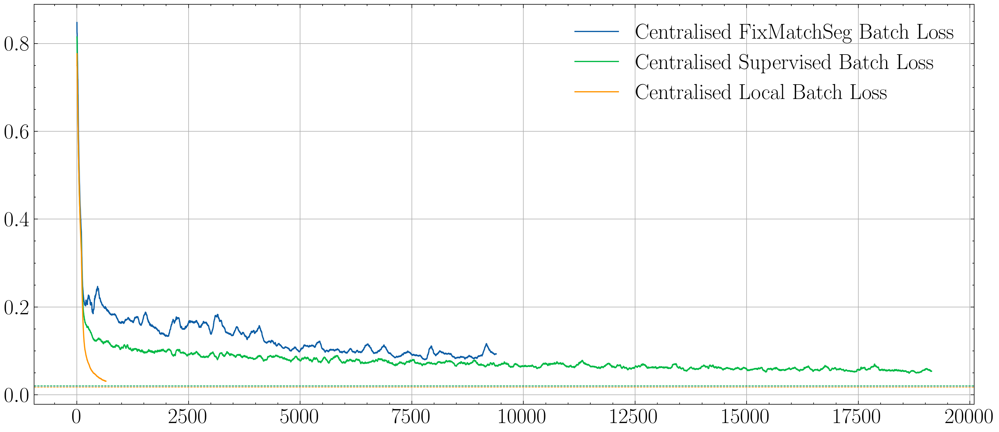

In [84]:
# Filter the dataframes
central_batch_loss_filtered = df_central[(df_central.tag == "centralised/loss/batch") & (df_central.dir_name == "centralised_loss_batch_train")][["step", "value"]][:10000]
central_batch_rolling = central_batch_loss_filtered["value"].rolling(window=100, min_periods=1).mean().values

# Plotting
line1, = plt.plot(central_batch_loss_filtered['step'][:len(central_batch_rolling)], central_batch_rolling, label="Centralised FixMatchSeg Batch Loss")
min_fixmatchseg = central_batch_loss_filtered['value'].min()
plt.axhline(min_fixmatchseg, color=line1.get_color(), linestyle='dashed', linewidth=0.5)

line2, = plt.plot(central_all_batch_loss['step'][:len(central_all_batch_rolling)], central_all_batch_rolling, label="Centralised Supervised Batch Loss")
min_supervised = central_all_batch_loss['value'].min()
plt.axhline(min_supervised, color=line2.get_color(), linestyle='dashed', linewidth=0.5)

line3, = plt.plot(central_local_batch_loss['step'][:len(central_local_batch_rolling)], central_local_batch_rolling, label="Centralised Local Batch Loss")
min_local = central_local_batch_loss['value'].min()
plt.axhline(min_local, color=line3.get_color(), linestyle='dashed', linewidth=0.5)


plt.legend()
plt.grid()
plt.show()


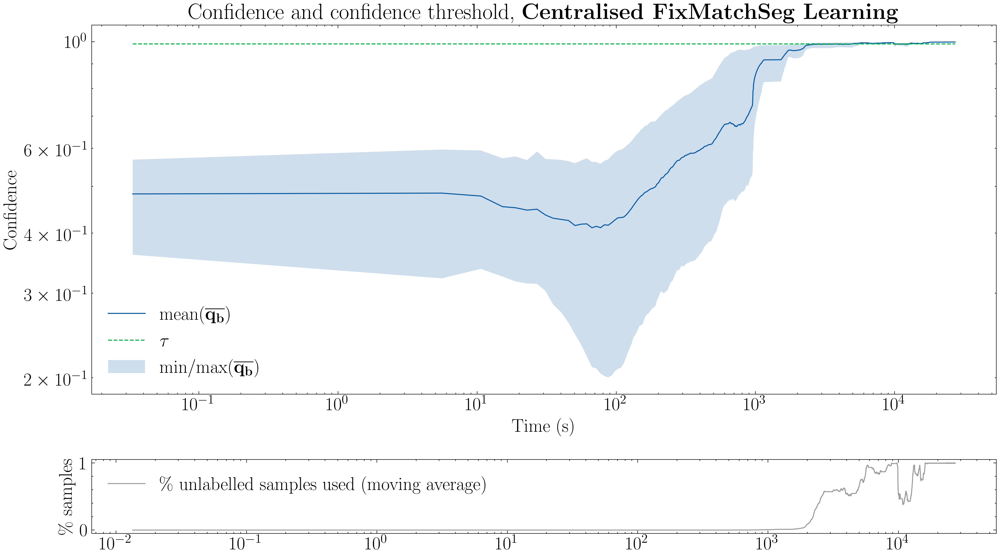

In [95]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

relevant_data = df_central.query("tag == 'centralised/loss/internal_variables'")
names = ["Labelled Confidence", 
         "max$(\mathbf{\overline{q_b}})$", 
         "mean($\mathbf{\overline{q_b}})$", 
         "min$(\mathbf{\overline{q_b}})$", 
         r"$\tau$"]
names_dict = {key: name for key, name in zip(relevant_data.dir_name.unique(), names)}

def get_rolling(df, w=100):
    return df["value"].rolling(window=w, min_periods=1).mean().values

tau_data = relevant_data[relevant_data.dir_name == "centralised_loss_internal_variables_tau"]
max_data = relevant_data[relevant_data.dir_name == "centralised_loss_internal_variables_qb_bar_max"]
min_data = relevant_data[relevant_data.dir_name == "centralised_loss_internal_variables_qb_bar_min"]
mean_data = relevant_data[relevant_data.dir_name == "centralised_loss_internal_variables_qb_bar_mean"]

# Define the figure
fig = plt.figure(figsize=(14, 8))

# Define the GridSpec
gs = gridspec.GridSpec(2, 1, height_ratios=[5, 1])  

# Define colour cycle
color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Create the first subplot
ax0 = plt.subplot(gs[0])

ax0.plot(mean_data.delta_time_in_seconds, get_rolling(mean_data), label="mean($\mathbf{\overline{q_b}})$")
ax0.plot(tau_data.delta_time_in_seconds, get_rolling(tau_data), label=r"$\tau$", linestyle='dashed')
ax0.fill_between(tau_data.delta_time_in_seconds, get_rolling(min_data), get_rolling(max_data), alpha=0.2, label="min/max$(\mathbf{\overline{q_b}})$")
ax0.set_xscale("log")
ax0.set_yscale("log")
ax0.legend()
ax0.set_title(r"Confidence and confidence threshold, \textbf{Centralised FixMatchSeg Learning}")
ax0.set_xlabel("Time (s)")
ax0.set_ylabel("Confidence")

# Create the second subplot (but leave it empty)
# plot
ax1 = plt.subplot(gs[1])
relevant_data = df_central.query("tag == 'centralised/loss/internal_counters'")
relevant_data = relevant_data.query("dir_name == 'centralised_loss_internal_counters_utilised unlabelled'")
pct_series = relevant_data
rolling = relevant_data.value.rolling(window=100, min_periods=1).mean().values
time_step = relevant_data.delta_time_in_seconds
#ax1.plot(time_step, relevant_data.value/16, alpha=0.1, color=color_cycle[-1], label="\# unlabelled samples used")
ax1.plot(time_step, rolling/16, color=color_cycle[-1], label=r"\% unlabelled samples used (moving average)")
ax1.legend()
ax1.set_xscale("log")
ax1.set_ylabel(r"\% samples")
plt.tight_layout()  # To prevent overlapping plots
plt.savefig("plots/fixmatchseg_internal_variables.pdf")
plt.show()


## Display images/predictions

In [2]:
import json
import numpy as np
from fedswarm.main import Platform
from fedswarm.utils.models.model_manager import load_model_from_checkpoint

folder = "runs/federated_5000unlabelled_100labelled_5clients_50rounds_1epochs"
with open(f"{folder}/config.json") as f:
    config = json.load(f)
model = load_model_from_checkpoint(f"{folder}/federated_fixmatchseg_12.pth", config)

# load the platform with the config
platform = Platform(config, data_only=True, write=False)

FixMatchSeg is not well supported, please use it with caution as config validation may not work


Same run already exists, skipping run but creates platform
Run found in federated_5000unlabelled_100labelled_5clients_50rounds_1epochs


Loading train frames:   0%|          | 0/89976 [00:00<?, ?it/s]

Loading val frames:   0%|          | 0/10024 [00:00<?, ?it/s]

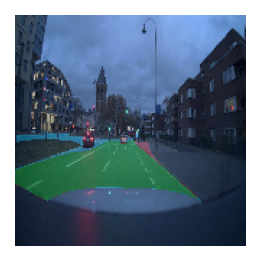

In [6]:
from zod.visualization.polygon_utils import overlay_mask_on_image
import matplotlib.pyplot as plt
to_plottable = lambda image: ((image - image.min()) / (image.max() - image.min()) * 255).astype("uint8").transpose(1, 2, 0)

def get_image_and_mask(model, platform, index):
    image, label = platform.data.val.dataset[index]
    prediction = model(image.unsqueeze(0).to("cuda"))
    image = image.cpu().numpy()
    label = label.cpu().numpy()
    predicted_mask = (prediction.squeeze() > 0.5).float().cpu().numpy().astype(np.uint8)
    return image, predicted_mask, label

def create_image(predicted_mask, label, image):
    overlap_mask = np.logical_and(predicted_mask, label).astype(np.uint8)
    missed_mask = np.logical_and(label, np.logical_not(predicted_mask)).astype(np.uint8)
    false_positive_mask = np.logical_and(predicted_mask, np.logical_not(label)).astype(np.uint8)
    
    rendered_image = overlay_mask_on_image(overlap_mask, to_plottable(image), fill_color=(0, 125, 0), alpha=0.5)
    rendered_image = overlay_mask_on_image(missed_mask, rendered_image, fill_color=(0, 125, 150), alpha=0.5)
    rendered_image = overlay_mask_on_image(false_positive_mask, rendered_image, fill_color=(125, 0, 0), alpha=0.5)
    
    return rendered_image

image, predicted_mask, label = get_image_and_mask(model, platform, 0)
rendered_image = create_image(predicted_mask, label, image)

# visualize the mask
plt.rcParams["figure.figsize"] = (1,1)
plt.axis("off")
plt.imshow(rendered_image)
plt.show()

In [31]:
import json
import numpy as np
from fedswarm.main import Platform
from fedswarm.utils.models.model_manager import load_model_from_checkpoint
import matplotlib.pyplot as plt
import numpy as np

folder = "runs/federated_5000unlabelled_100labelled_5clients_50rounds_1epochs"
with open(f"{folder}/config.json") as f:
    config = json.load(f)
model = load_model_from_checkpoint(f"{folder}/federated_fixmatchseg_0.pth", config)

# load the platform with the config
platform = Platform(config, data_only=True, write=False)


FixMatchSeg is not well supported, please use it with caution as config validation may not work


Same run already exists, skipping run but creates platform
Run found in federated_5000unlabelled_100labelled_5clients_50rounds_1epochs


Loading train frames:   0%|          | 0/89976 [00:00<?, ?it/s]

Loading val frames:   0%|          | 0/10024 [00:00<?, ?it/s]

In [33]:
import plotly.graph_objects as go
import numpy as np

# Assume you have these variables
image = platform.data.val.dataset[0][0]
tau = 0.99   # define tau value

# Assuming your model's output is a 2D tensor
output = model(image.unsqueeze(0).to("cuda")).squeeze().cpu().detach().numpy()
max_labelled_confidences = np.abs(output -0.5) * 2
mean_labelled_confidence = np.mean(max_labelled_confidences)

# Create indices for x and y
x_data = np.arange(output.shape[0])
y_data = np.arange(output.shape[1])

# Create a grid for x and y
X, Y = np.meshgrid(x_data, y_data)

# Use the model's output as Z values.
Z = max_labelled_confidences

# Create a surface trace for the output values
surface_trace = go.Surface(x=X, y=Y, z=Z, colorscale='Viridis')

# Create a surface trace for the plane at z=tau
# Extend the planes by 15 units in both x and y directions
extension = 5
X_plane, Y_plane = np.meshgrid(np.linspace(np.min(X) - extension, np.max(X) + extension, num=100),
                               np.linspace(np.min(Y) - extension, np.max(Y) + extension, num=100))
Z_plane_tau = np.full(X_plane.shape, tau)
Z_plane_mean = np.full(X_plane.shape, mean_labelled_confidence)

# Colour scale
red_colorscale = [[0, 'red'], [1, 'red']] 
blue_colorscale = [[0, 'blue'], [1, 'blue']]

tau_plane_trace = go.Surface(x=X_plane, y=Y_plane, z=Z_plane_tau, showscale=False, opacity=0.5, colorscale=blue_colorscale)
mean_plane_trace = go.Surface(x=X_plane, y=Y_plane, z=Z_plane_mean, showscale=False, opacity=0.5, colorscale=red_colorscale)

# Create a layout for the plot
layout = go.Layout(scene=dict(zaxis=dict(range=[np.min(Z), 1.1])), width=900, height=900)

# Create the figure and add the surfaces
fig = go.Figure(data=[surface_trace, tau_plane_trace, mean_plane_trace], layout=layout)

# Show the figure
fig.show()


In [219]:
start_from = 8 * 0
data_set_index_range = range(start_from, start_from + 8)

In [ ]:
with open(f"{folder}/config.json") as f:
    config = json.load(f)
    
folder_fed = "runs/federated_5000unlabelled_100labelled_5clients_50rounds_1epochs"
model_fed = load_model_from_checkpoint(f"{folder}/federated_fixmatchseg_12.pth", config)

folder_local = "runs/central_100labelled_100epochs_99tau"
model_local = load_model_from_checkpoint(f"{folder}/best_model.pth", config)

folder_central = "runs/central_5100labelled_50epochs_99tau"
model_central = load_model_from_checkpoint(f"{folder}/best_model.pth", config)

folder_fixmatchseg = "runs/central_fixmatch_5000unlabelled_100labelled_30epochs_99tau"
model_fixmatchseg = load_model_from_checkpoint(f"{folder}/best_model.pth", config)

fig, axs = plt.subplots(2, 4, figsize=(20, 10))  # Create a 2-row, 4-column grid of subplots with specified size

models = [model_fed, model_local, model_central, model_fixmatchseg]
names = ["Federated FixMatchSeg", "Centralised Local", "Centralised", "Centralised FixMatchSeg"]

# Now axs is a 2D numpy array with shape (2, 4), each element being an Axes object.
# You can draw on these axes by indexing into axs.

# For example, let's draw images for the first 8 indices in your dataset:

for i, (model, name) in enumerate(zip(models, names)):
    rci = i % 8
    row = rci // 4  # Integer division to get row index
    col = rci % 4   # Modulo operation to get column index

    image, predicted_mask, label = get_image_and_mask(model, platform, i)
    rendered_image = create_image(predicted_mask, label, image)

    axs[row, col].axis("off")
    axs[row, col].imshow(rendered_image)
    axs[row, col].set_title(f"{name}")

# Adjust the layout so the images do not overlap
plt.suptitle("Predictions of the federated FixMatchSeg model")
plt.tight_layout()
plt.savefig("plots/fixmatchseg_predictions_federated.pdf")
plt.show()


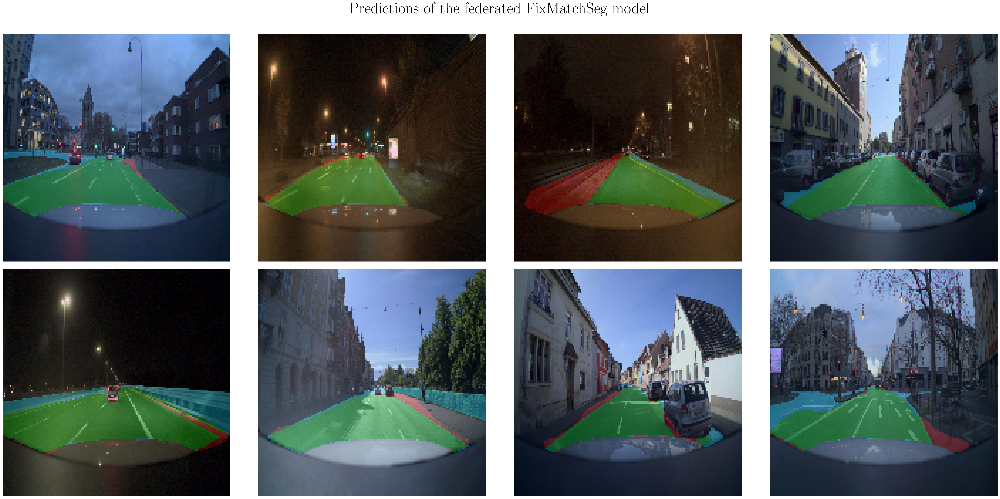

In [220]:
folder = "runs/federated_5000unlabelled_100labelled_5clients_50rounds_1epochs"
with open(f"{folder}/config.json") as f:
    config = json.load(f)
model = load_model_from_checkpoint(f"{folder}/federated_fixmatchseg_12.pth", config)

fig, axs = plt.subplots(2, 4, figsize=(20, 10))  # Create a 2-row, 4-column grid of subplots with specified size

# Now axs is a 2D numpy array with shape (2, 4), each element being an Axes object.
# You can draw on these axes by indexing into axs.

# For example, let's draw images for the first 8 indices in your dataset:

for i in data_set_index_range:
    rci = i % 8
    row = rci // 4  # Integer division to get row index
    col = rci % 4   # Modulo operation to get column index

    image, predicted_mask, label = get_image_and_mask(model, platform, i)
    rendered_image = create_image(predicted_mask, label, image)

    axs[row, col].axis("off")
    axs[row, col].imshow(rendered_image)

# Adjust the layout so the images do not overlap
plt.suptitle("Predictions of the federated FixMatchSeg model")
plt.tight_layout()
plt.savefig("plots/fixmatchseg_predictions_federated.pdf")
plt.show()


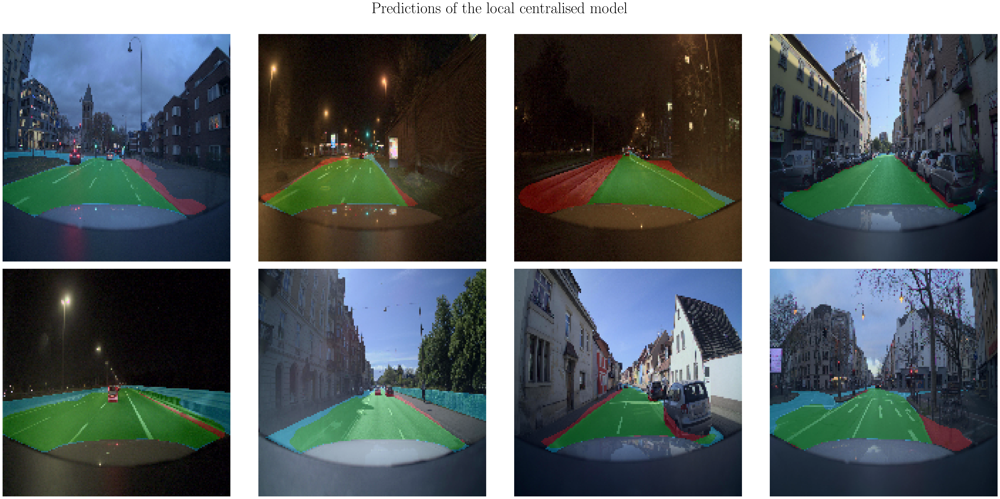

In [221]:
folder = "runs/central_100labelled_100epochs_99tau"
with open(f"{folder}/config.json") as f:
    config = json.load(f)
model = load_model_from_checkpoint(f"{folder}/best_model.pth", config)

fig, axs = plt.subplots(2, 4, figsize=(20, 10))  # Create a 2-row, 4-column grid of subplots with specified size

# Now axs is a 2D numpy array with shape (2, 4), each element being an Axes object.
# You can draw on these axes by indexing into axs.

# For example, let's draw images for the first 8 indices in your dataset:

for i in data_set_index_range:
    rci = i % 8
    row = rci // 4  # Integer division to get row index
    col = rci % 4   # Modulo operation to get column index

    image, predicted_mask, label = get_image_and_mask(model, platform, i)
    rendered_image = create_image(predicted_mask, label, image)

    axs[row, col].axis("off")
    axs[row, col].imshow(rendered_image)

# Adjust the layout so the images do not overlap
plt.suptitle("Predictions of the local centralised model")
plt.tight_layout()
plt.savefig("plots/fixmatchseg_predictions_local_central.pdf")
plt.show()

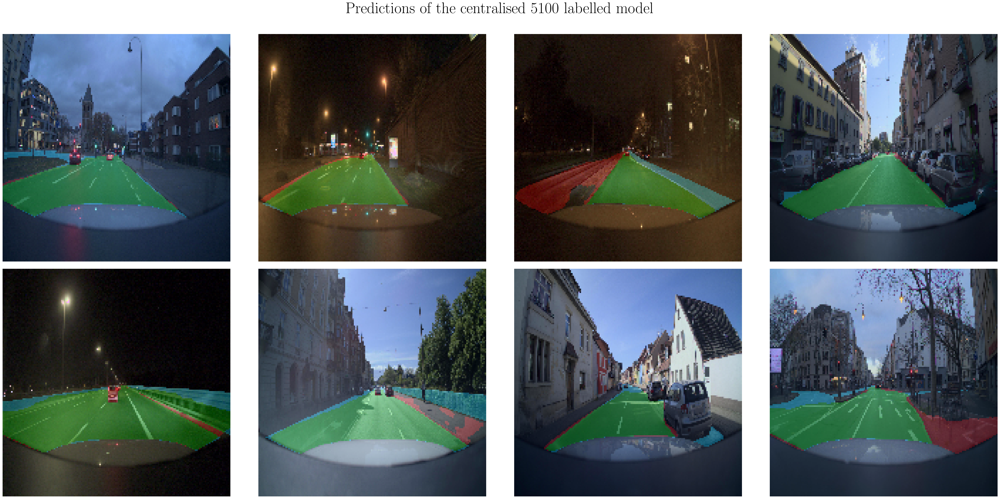

In [222]:
folder = "runs/central_5100labelled_50epochs_99tau"
with open(f"{folder}/config.json") as f:
    config = json.load(f)
model = load_model_from_checkpoint(f"{folder}/best_model.pth", config)

fig, axs = plt.subplots(2, 4, figsize=(20, 10))  # Create a 2-row, 4-column grid of subplots with specified size

# Now axs is a 2D numpy array with shape (2, 4), each element being an Axes object.
# You can draw on these axes by indexing into axs.

# For example, let's draw images for the first 8 indices in your dataset:

for i in data_set_index_range:
    rci = i % 8
    row = rci // 4  # Integer division to get row index
    col = rci % 4   # Modulo operation to get column index

    image, predicted_mask, label = get_image_and_mask(model, platform, i)
    rendered_image = create_image(predicted_mask, label, image)

    axs[row, col].axis("off")
    axs[row, col].imshow(rendered_image)

# Adjust the layout so the images do not overlap
plt.suptitle("Predictions of the centralised 5100 labelled model")
plt.tight_layout()
plt.savefig("plots/fixmatchseg_predictions_central_5100.pdf")
plt.show()


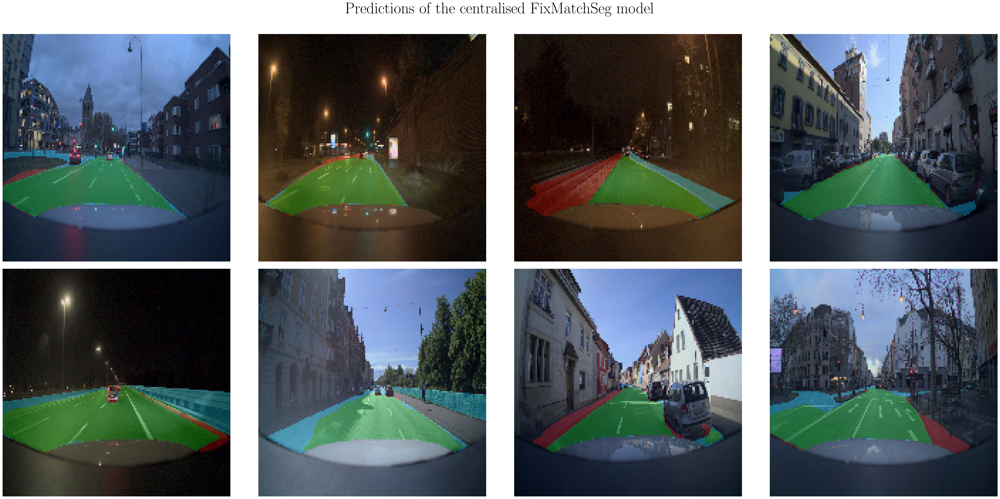

In [223]:
folder = "runs/central_fixmatch_5000unlabelled_100labelled_30epochs_99tau"
with open(f"{folder}/config.json") as f:
    config = json.load(f)
model = load_model_from_checkpoint(f"{folder}/best_model.pth", config)

fig, axs = plt.subplots(2, 4, figsize=(20, 10))  # Create a 2-row, 4-column grid of subplots with specified size

# Now axs is a 2D numpy array with shape (2, 4), each element being an Axes object.
# You can draw on these axes by indexing into axs.

# For example, let's draw images for the first 8 indices in your dataset:

for i in data_set_index_range:
    rci = i % 8
    row = rci // 4  # Integer division to get row index
    col = rci % 4   # Modulo operation to get column index

    image, predicted_mask, label = get_image_and_mask(model, platform, i)
    rendered_image = create_image(predicted_mask, label, image)

    axs[row, col].axis("off")
    axs[row, col].imshow(rendered_image)

# Adjust the layout so the images do not overlap
plt.suptitle("Predictions of the centralised FixMatchSeg model")
plt.tight_layout()
plt.savefig("plots/fixmatchseg_predictions_central_fixmatchseg.pdf")
plt.show()


In [234]:
min_supervised, min_fed, min_fixmatchseg, min_local

(0.1361927092075348,
 0.1563134491443634,
 0.15128940343856812,
 0.1787305623292923)